In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

def plot_data(size_column, C_column):
   
    # Fixed file paths
    file1_path = "cleaned_mastersheet_q5.xlsx"
    file2_path = "filtered_data.xlsx"

    # Read Excel files
    df1 = pd.read_excel(file1_path, header=1)
    df2 = pd.read_excel(file2_path)

    # Ensure correct column names
    age_column = "Age (Ma)"  # X-axis column for table 1
    time_column = "Tuned time [Ma]"  # X-axis column for table 2
    
    # Handle NaN data (fill with interpolation)
    df1[size_column] = df1[size_column].interpolate(method='linear', limit_direction='both')
    df2[C_column] = df2[C_column].interpolate(method='linear', limit_direction='both')

    # Create figure and dual y-axes
    fig, ax1 = plt.subplots(figsize=(10, 5))

    # Plot data from table 1
    ax1.set_xlabel("Age (Ma) / Tuned time [Ma]")
    ax1.set_ylabel(size_column, color="tab:blue")
    ax1.plot(df1[age_column], df1[size_column], label="Size", color="tab:blue")
    ax1.tick_params(axis='y', labelcolor="tab:blue")

    # Create second y-axis
    ax2 = ax1.twinx()
    ax2.set_ylabel(C_column, color="tab:red")
    ax2.plot(df2[time_column], df2[C_column], label="C", color="tab:red")
    ax2.tick_params(axis='y', labelcolor="tab:red")

    # Add legend
    fig.tight_layout()
    plt.title(f"{size_column} vs. {C_column} with Age/Time as X-axis (0-5 Range)")
    plt.show()

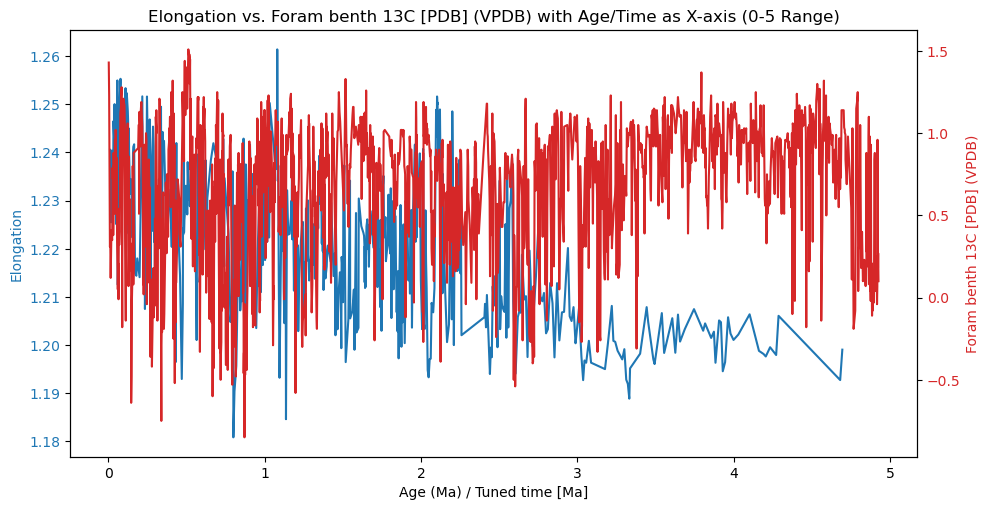

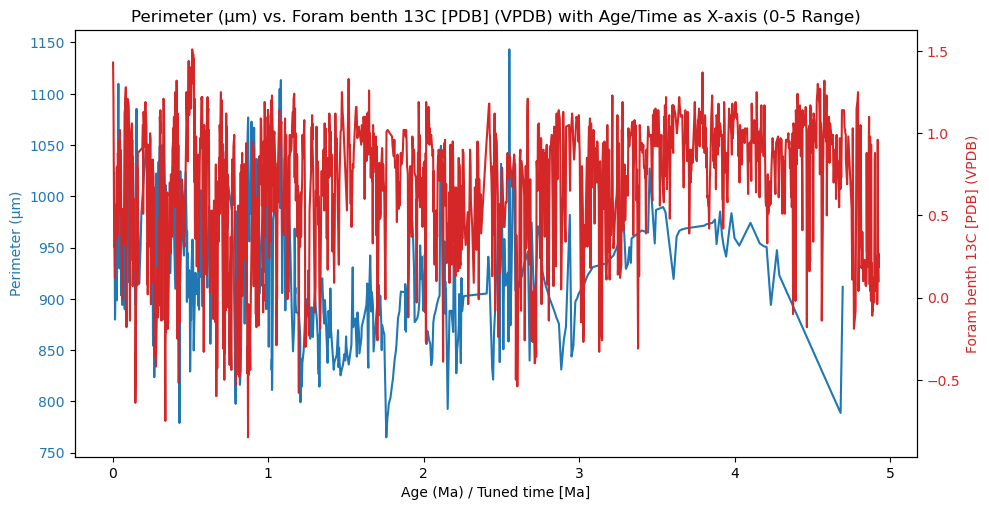

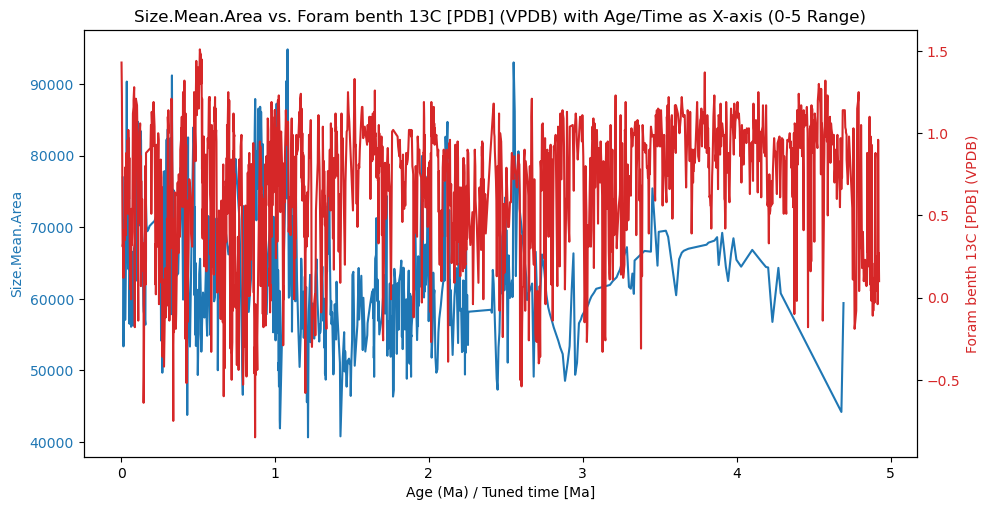

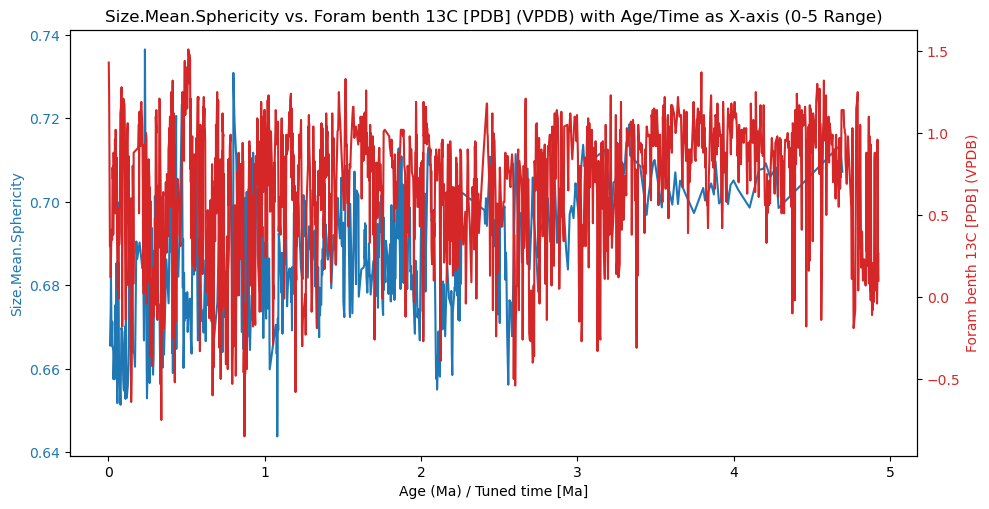

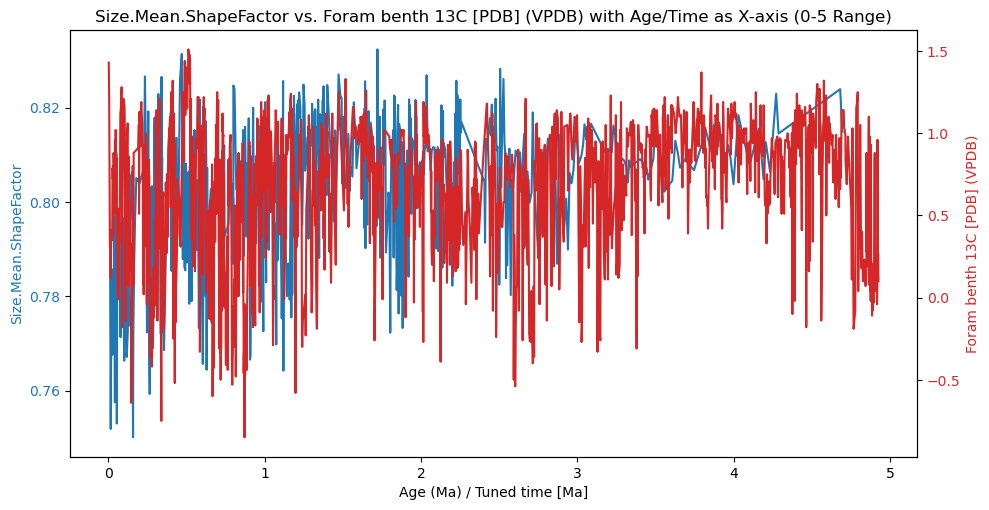

...

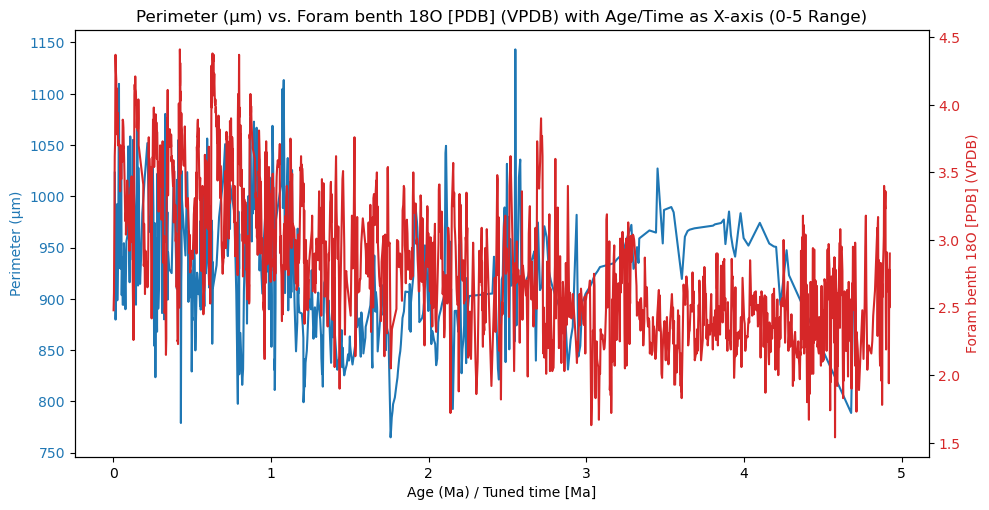

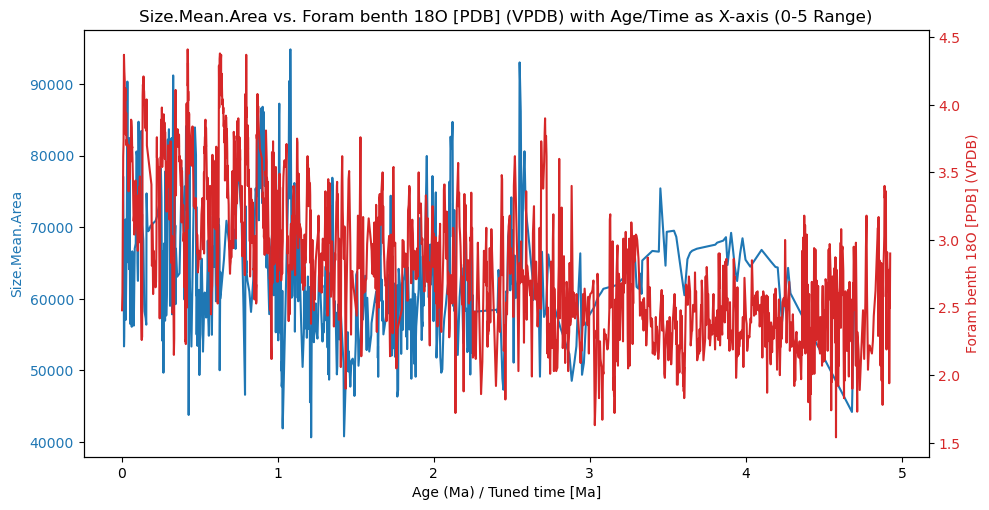

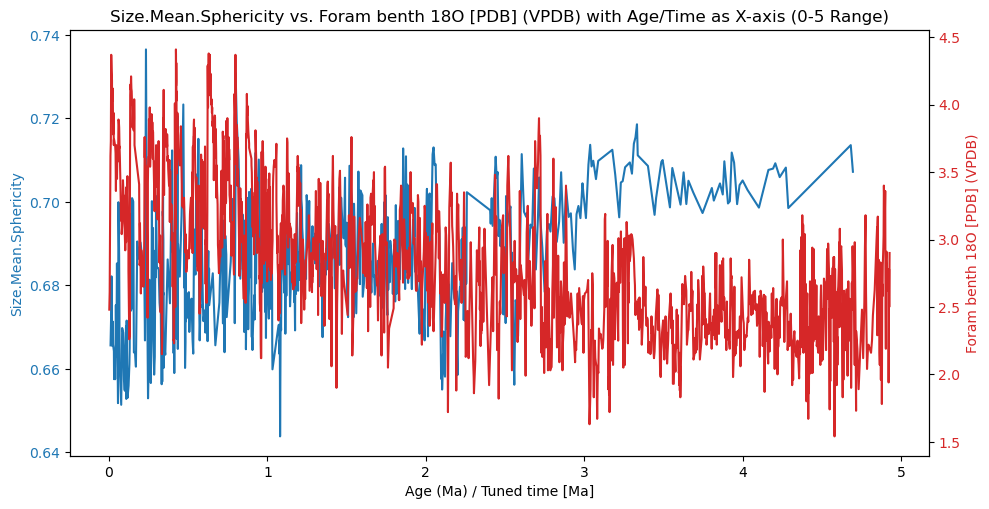

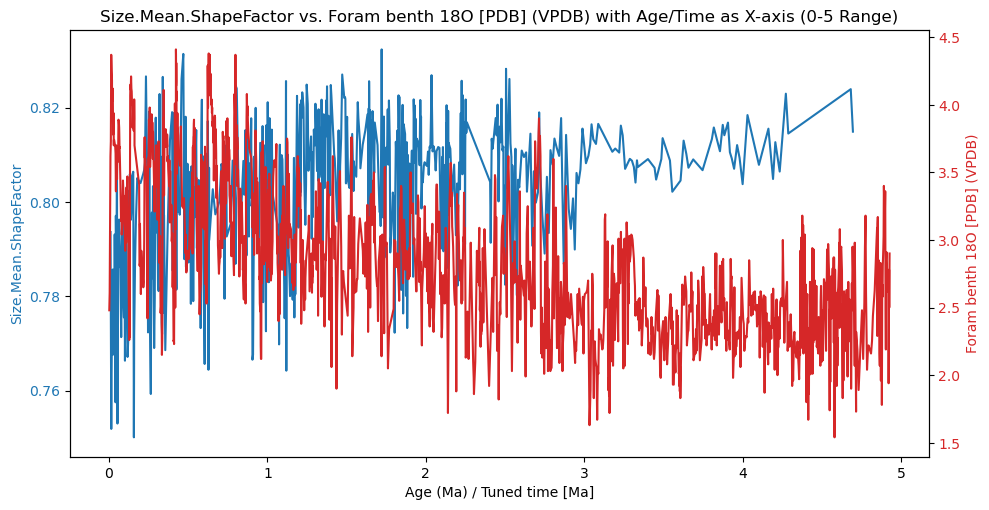

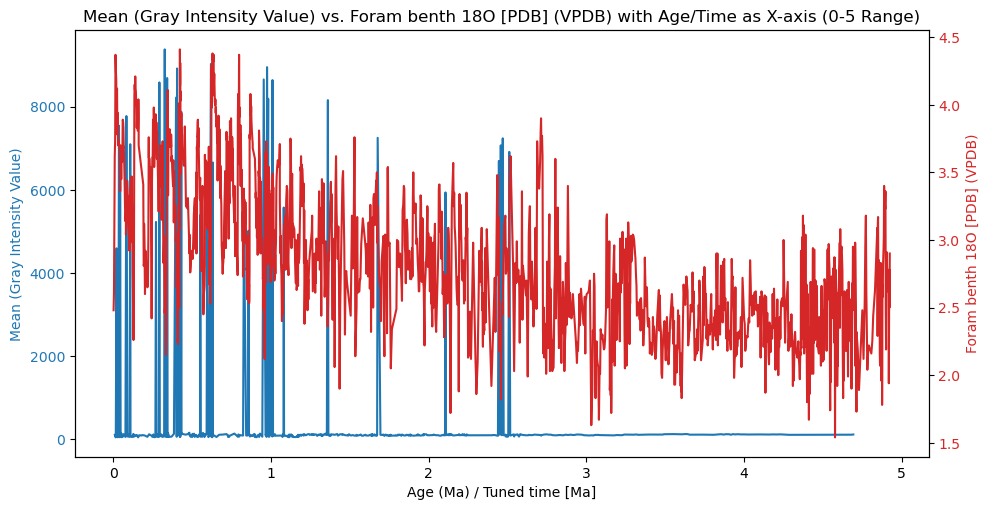

In [7]:
plot_data("Elongation", "Foram benth 13C [PDB] (VPDB)")
plot_data("Perimeter (µm)", "Foram benth 13C [PDB] (VPDB)")
plot_data("Size.Mean.Area", "Foram benth 13C [PDB] (VPDB)")
plot_data("Size.Mean.Sphericity", "Foram benth 13C [PDB] (VPDB)")
plot_data("Size.Mean.ShapeFactor", "Foram benth 13C [PDB] (VPDB)")
plot_data("Mean (Gray Intensity Value)", "Foram benth 13C [PDB] (VPDB)")
plot_data("Elongation", "Foram benth 18O [PDB] (VPDB)")
plot_data("Perimeter (µm)", "Foram benth 18O [PDB] (VPDB)")
plot_data("Size.Mean.Area", "Foram benth 18O [PDB] (VPDB)")
plot_data("Size.Mean.Sphericity", "Foram benth 18O [PDB] (VPDB)")
plot_data("Size.Mean.ShapeFactor", "Foram benth 18O [PDB] (VPDB)")
plot_data("Mean (Gray Intensity Value)", "Foram benth 18O [PDB] (VPDB)")


In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Function to load and process data
def load_and_process_data(size_column, C_column):
    # Fixed file paths
    file1_path = "cleaned_mastersheet_q5.xlsx"
    file2_path = "filtered_data.xlsx"

    # Read Excel files
    df1 = pd.read_excel(file1_path, header=1)
    df2 = pd.read_excel(file2_path)

    # Ensure correct column names
    age_column = "Age (Ma)"  # X-axis column for table 1
    time_column = "Tuned time [Ma]"  # X-axis column for table 2

    # Filter tables to keep only data with time between 0-3
    df1_filtered = df1[(df1[age_column] >= 0) & (df1[age_column] <= 3)]
    df2_filtered = df2[(df2[time_column] >= 0) & (df2[time_column] <= 3)]
    
    # Handle NaN values (fill with interpolation)
    df1_filtered[size_column] = df1_filtered[size_column].interpolate(method='linear', limit_direction='both')
    df2_filtered[C_column] = df2_filtered[C_column].interpolate(method='linear', limit_direction='both')
    
    return df1_filtered, df2_filtered, age_column, time_column




In [11]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_data1(size_column, C_column):
    # Call the data loading and processing function
    df1_filtered, df2_filtered, age_column, time_column = load_and_process_data(size_column, C_column)

    # Create figure and dual y-axes
    fig, ax1 = plt.subplots(figsize=(10, 5))

    # Plot data from table 1
    ax1.set_xlabel("Age (Ma) / Tuned time [Ma]")
    ax1.set_ylabel(size_column, color="tab:blue")
    ax1.plot(df1_filtered[age_column], df1_filtered[size_column], label="Size", color="tab:blue")
    ax1.tick_params(axis='y', labelcolor="tab:blue")

    # Create second y-axis
    ax2 = ax1.twinx()
    ax2.set_ylabel(C_column, color="tab:red")
    ax2.plot(df2_filtered[time_column], df2_filtered[C_column], label="C", color="tab:red")
    ax2.tick_params(axis='y', labelcolor="tab:red")

    # Add legend and format layout
    fig.tight_layout()
    plt.title(f"{size_column} vs. {C_column} with Age/Time as X-axis (0-3 Range)")
    plt.show()


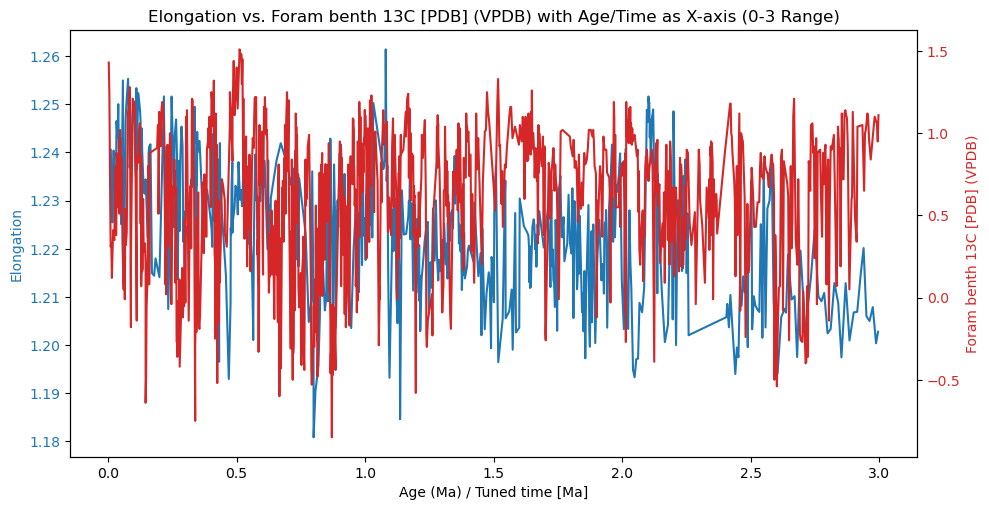

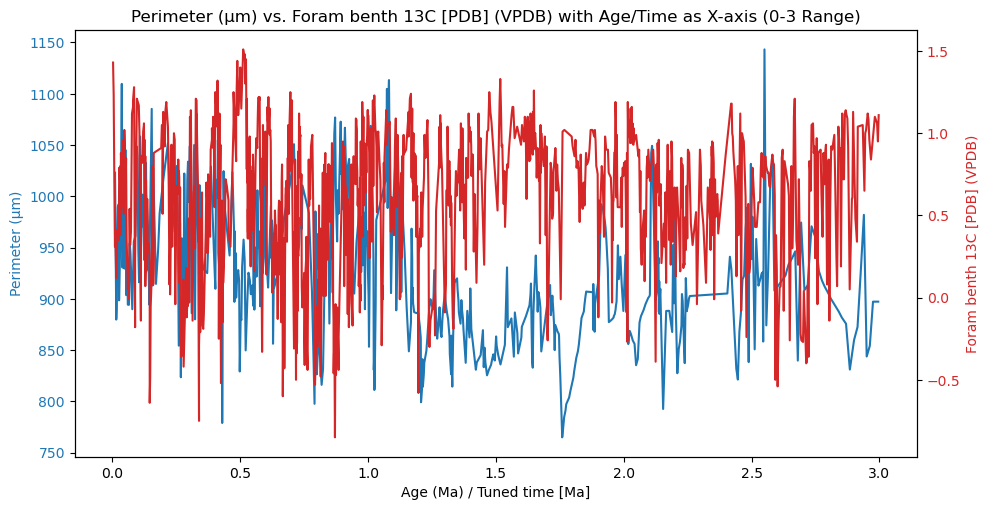

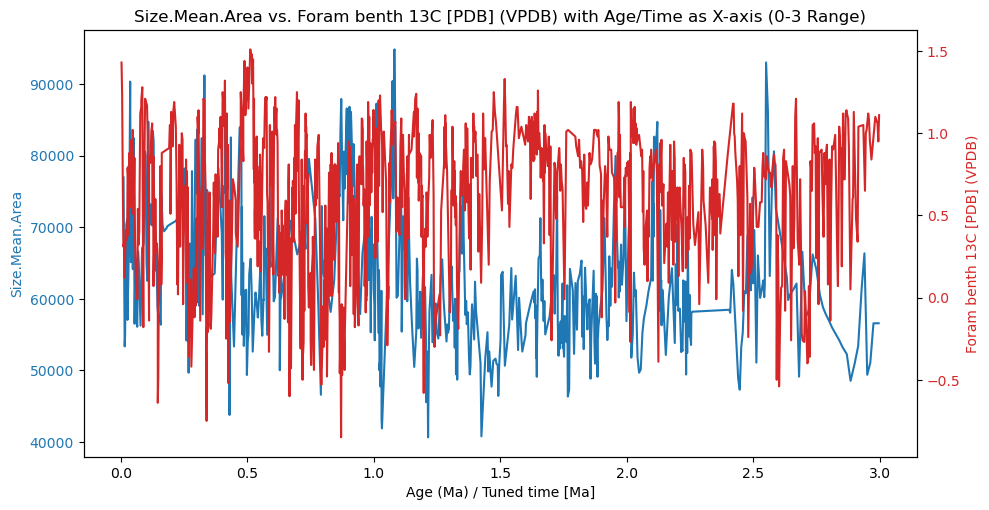

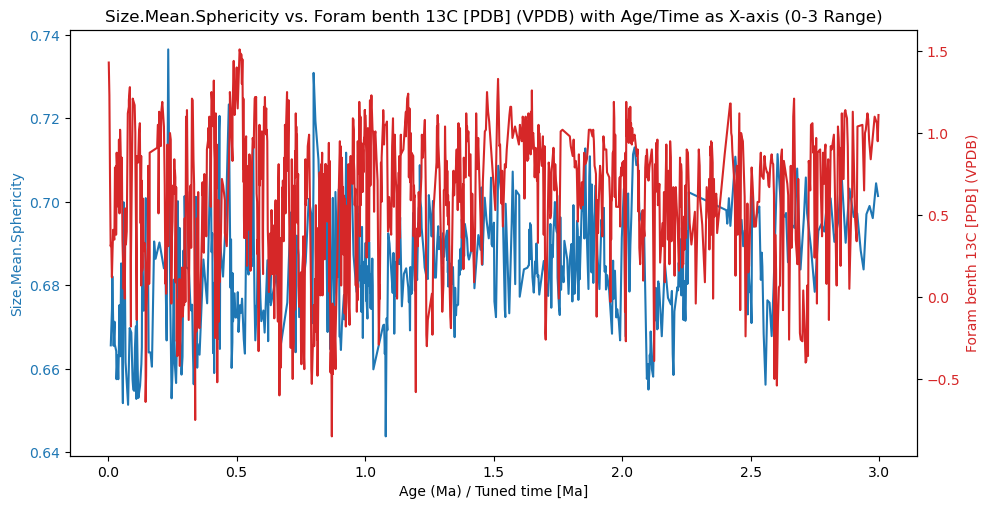

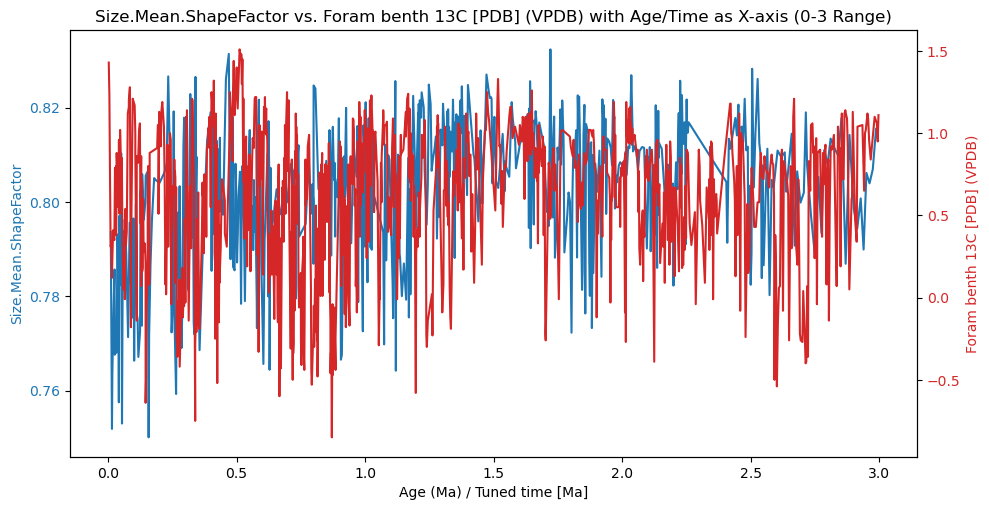

...

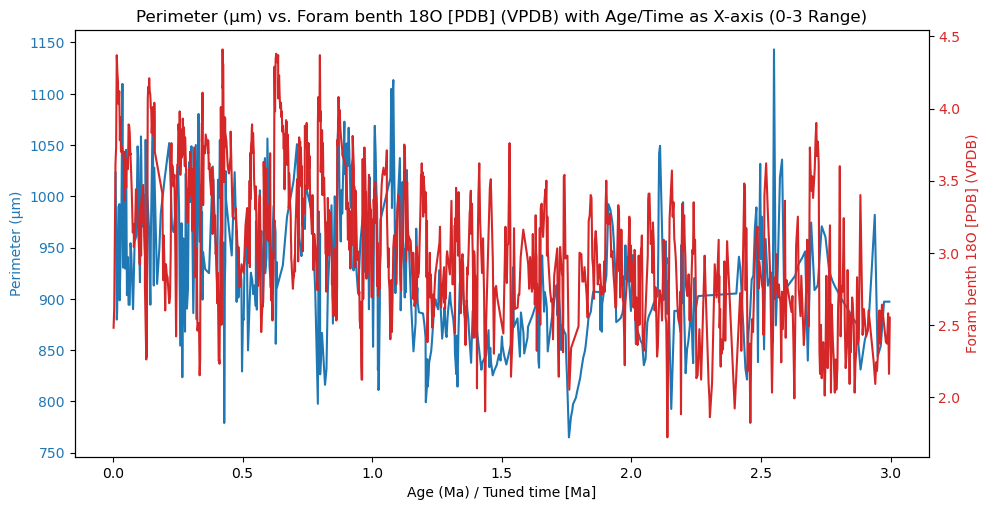

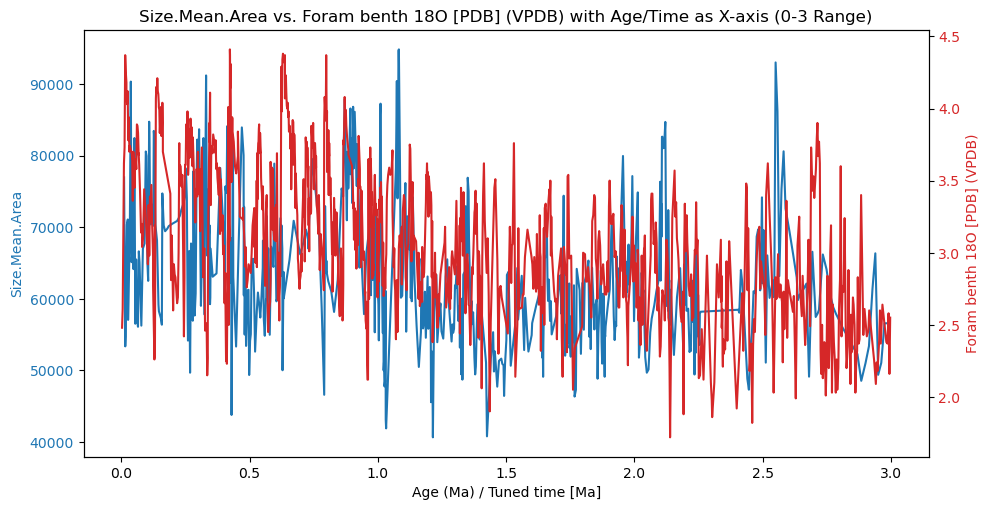

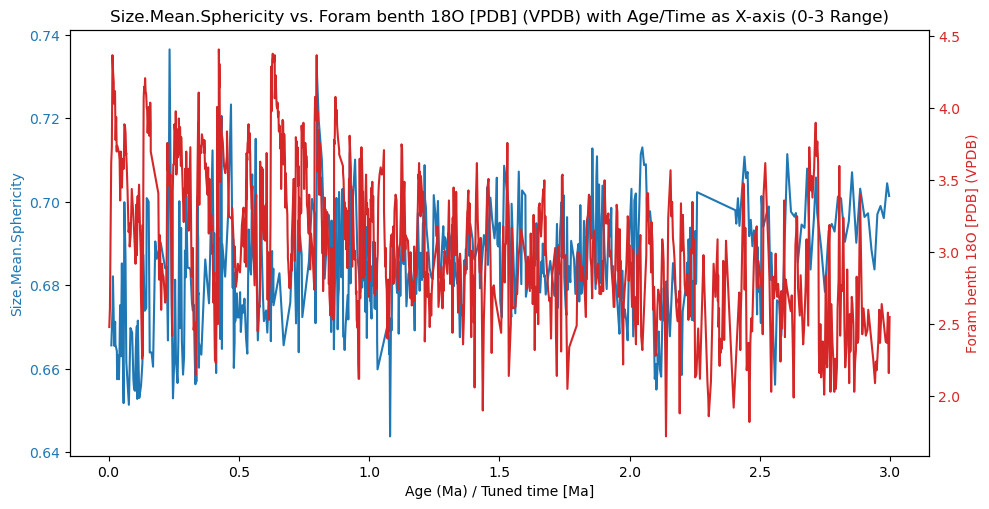

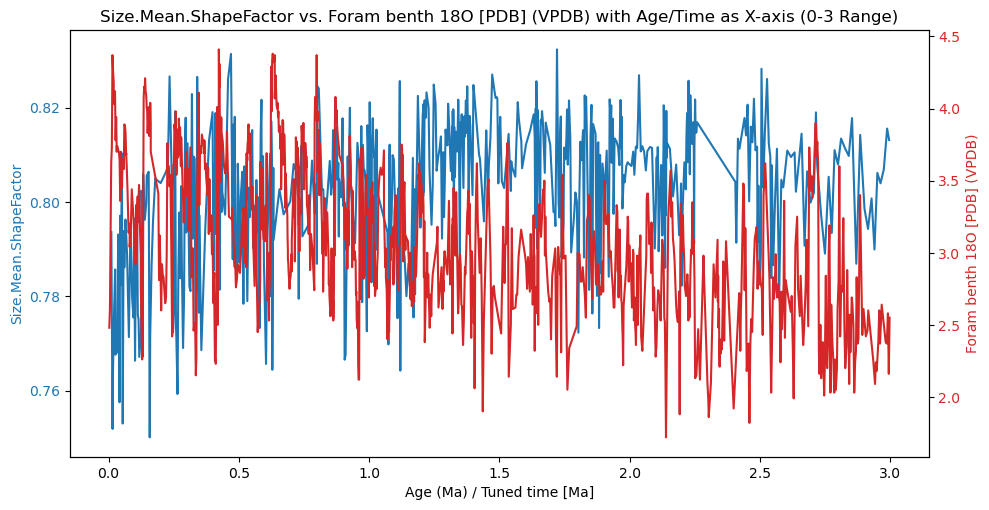

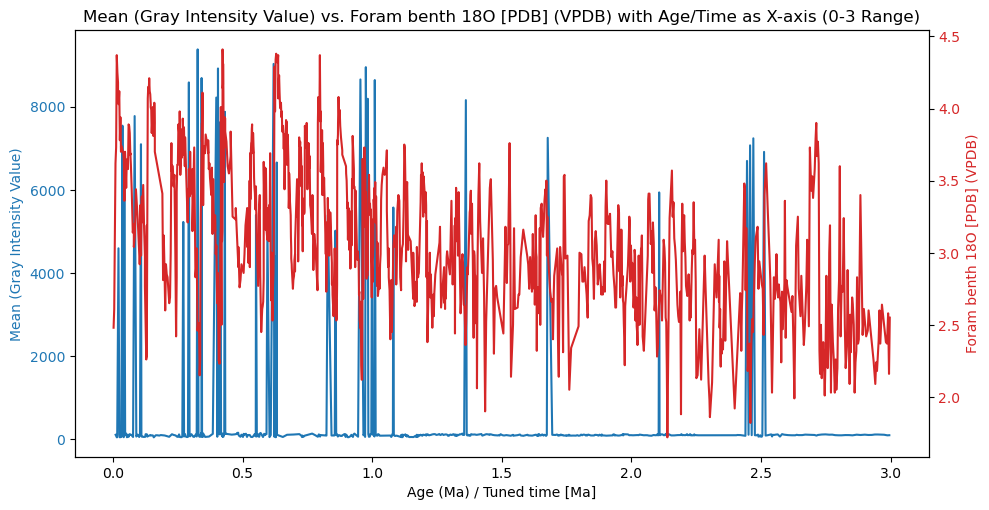

In [5]:
plot_data1("Elongation", "Foram benth 13C [PDB] (VPDB)")
plot_data1("Perimeter (µm)", "Foram benth 13C [PDB] (VPDB)")
plot_data1("Size.Mean.Area", "Foram benth 13C [PDB] (VPDB)")
plot_data1("Size.Mean.Sphericity", "Foram benth 13C [PDB] (VPDB)")
plot_data1("Size.Mean.ShapeFactor", "Foram benth 13C [PDB] (VPDB)")
plot_data1("Mean (Gray Intensity Value)", "Foram benth 13C [PDB] (VPDB)")
plot_data1("Elongation", "Foram benth 18O [PDB] (VPDB)")
plot_data1("Perimeter (µm)", "Foram benth 18O [PDB] (VPDB)")
plot_data1("Size.Mean.Area", "Foram benth 18O [PDB] (VPDB)")
plot_data1("Size.Mean.Sphericity", "Foram benth 18O [PDB] (VPDB)")
plot_data1("Size.Mean.ShapeFactor", "Foram benth 18O [PDB] (VPDB)")
plot_data1("Mean (Gray Intensity Value)", "Foram benth 18O [PDB] (VPDB)")


In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

def detect_outliers(series, threshold=3):
    """Detect outliers in a time series using differential analysis.
    
    Args:
        series: Pandas Series of values
        threshold: Number of standard deviations to consider as outlier
        
    Returns:
        Boolean Series indicating outlier positions
    """
    diff = series.diff().fillna(0)  # Calculate first-order difference
    mean, std = diff.mean(), diff.std()  # Compute mean and standard deviation
    return (np.abs(diff - mean) > threshold * std)  # Identify points beyond threshold*std

def plot_mutation_analysis(size_column, C_column):
    """Visualize time series data with mutation points highlighted.
    
    Args:
        size_column: Column name for size data in first dataframe
        C_column: Column name for C data in second dataframe
    """
    # Load and preprocess data
    df1_filtered, df2_filtered, age_column, time_column = load_and_process_data(size_column, C_column)

    # Detect mutation points (using higher threshold to reduce false positives)
    size_outliers = detect_outliers(df1_filtered[size_column], threshold=3)
    C_outliers = detect_outliers(df2_filtered[C_column], threshold=3)

    # Create figure for mutation analysis
    fig, ax1 = plt.subplots(figsize=(10, 5))

    # Plot size data (primary axis)
    ax1.set_xlabel("Age (Ma) / Tuned time [Ma]")
    ax1.set_ylabel(size_column, color="tab:blue")
    ax1.plot(df1_filtered[age_column], df1_filtered[size_column], label="Size", color="tab:blue")
    ax1.tick_params(axis='y', labelcolor="tab:blue")

    # Mark size mutation points with vertical lines
    for idx in df1_filtered.index[size_outliers]:
        ax1.axvline(df1_filtered[age_column][idx], color="cyan", linestyle="--", alpha=0.6)

    # Create secondary axis for C data
    ax2 = ax1.twinx()
    ax2.set_ylabel(C_column, color="tab:red")
    ax2.plot(df2_filtered[time_column], df2_filtered[C_column], label="C", color="tab:red")
    ax2.tick_params(axis='y', labelcolor="tab:red")

    # Mark C mutation points with vertical lines
    for idx in df2_filtered.index[C_outliers]:
        ax2.axvline(df2_filtered[time_column][idx], color="orange", linestyle="--", alpha=0.6)
        
    # Create custom legend for mutation markers
    cyan_line = Line2D([0], [0], color='cyan', linestyle="--", label=f"{size_column} Mutation")
    orange_line = Line2D([0], [0], color='orange', linestyle="--", label=f"{C_column} Mutation")
    ax1.legend(handles=[cyan_line, orange_line], loc="upper right", frameon=False)

    plt.title(f"Mutation Analysis ({size_column} vs. {C_column})")
    plt.show()



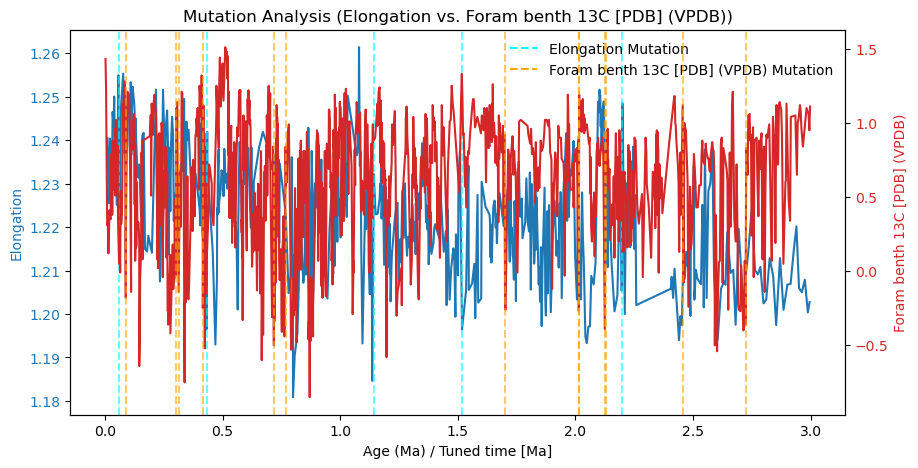

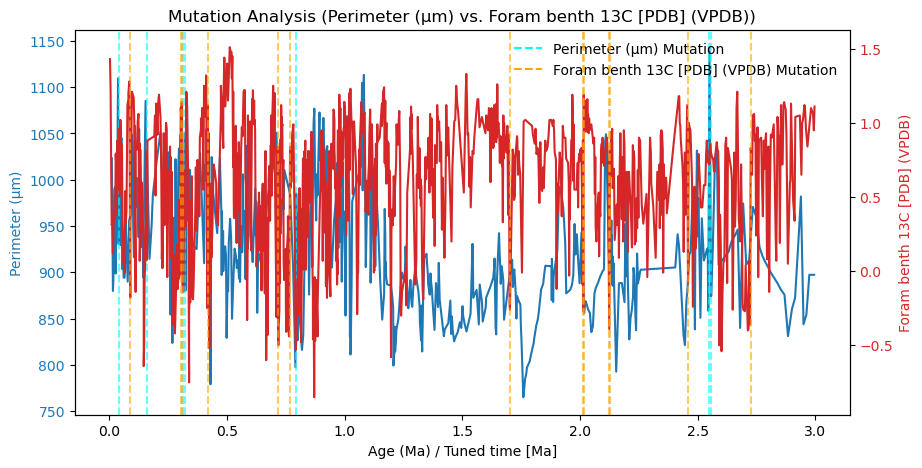

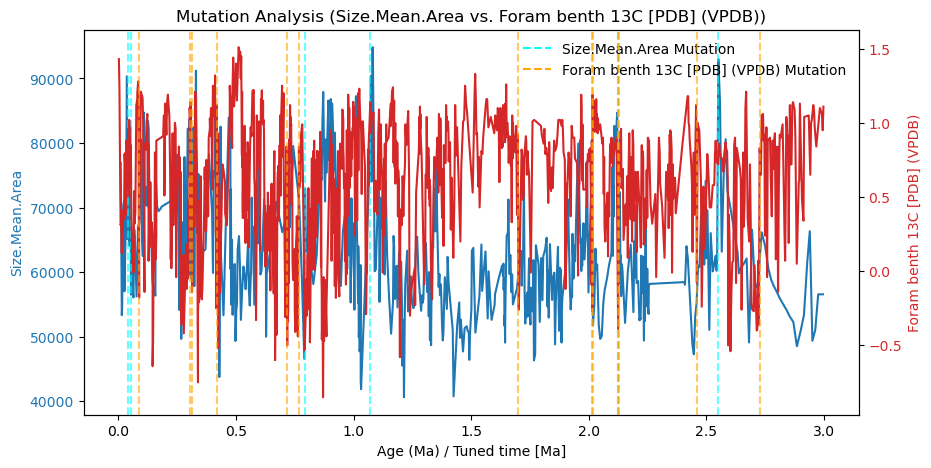

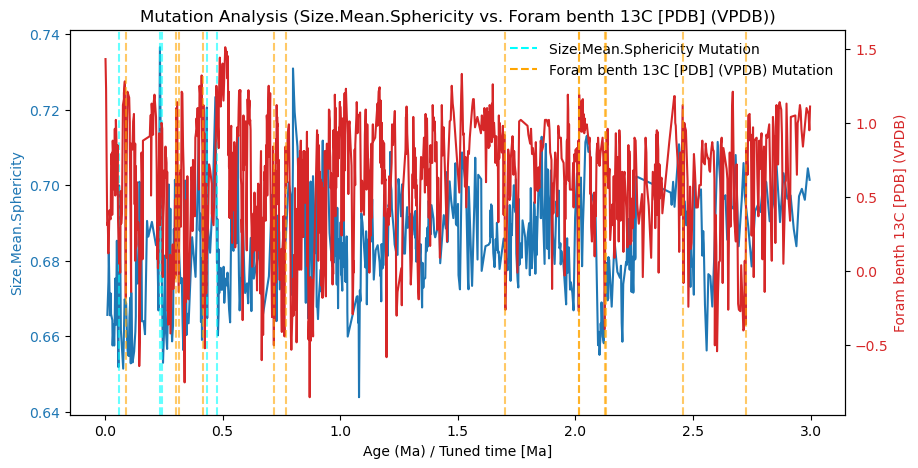

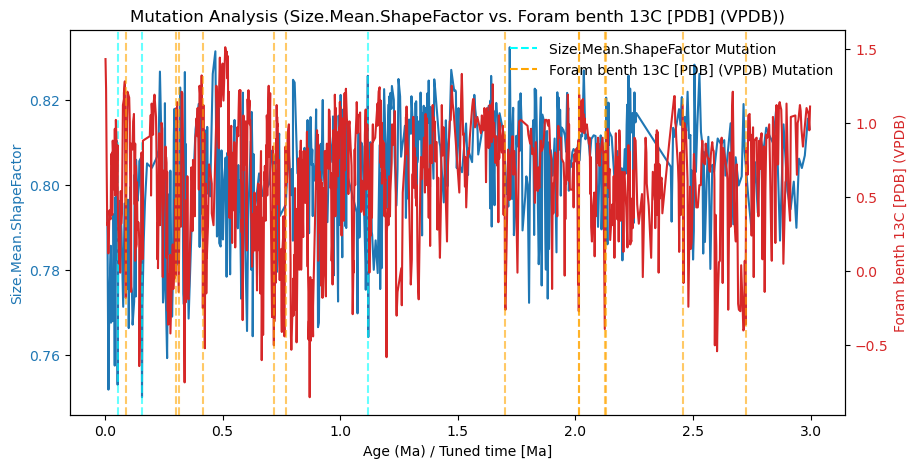

...

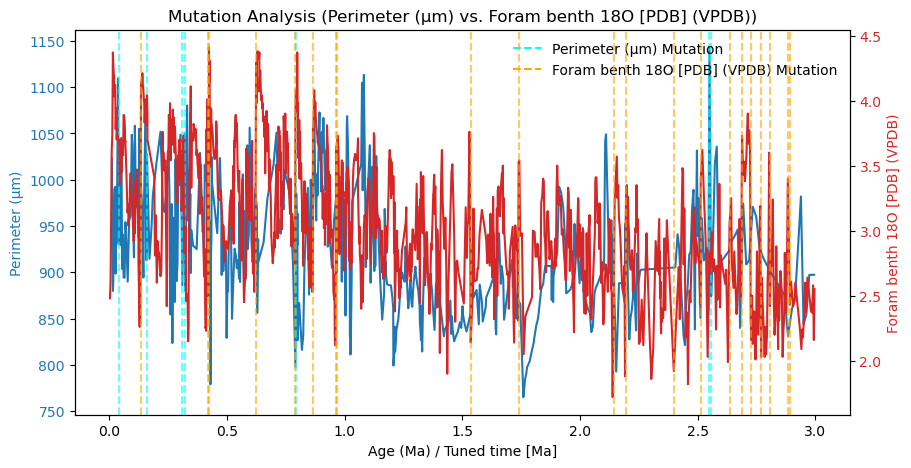

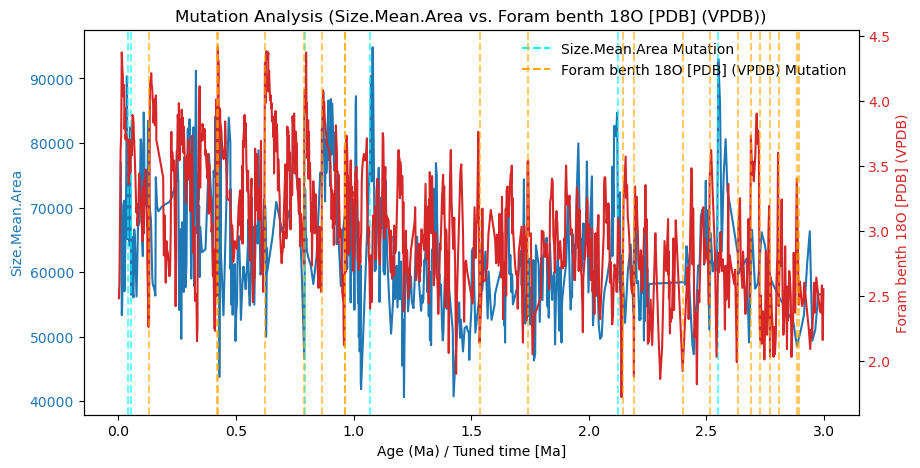

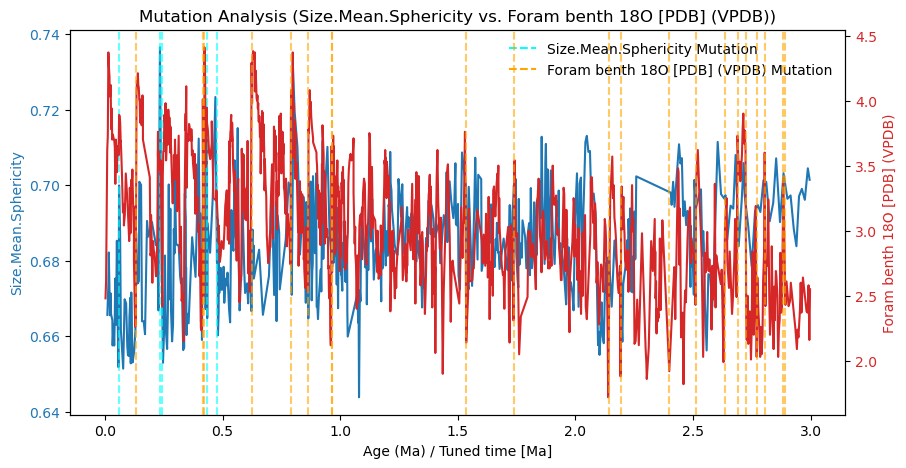

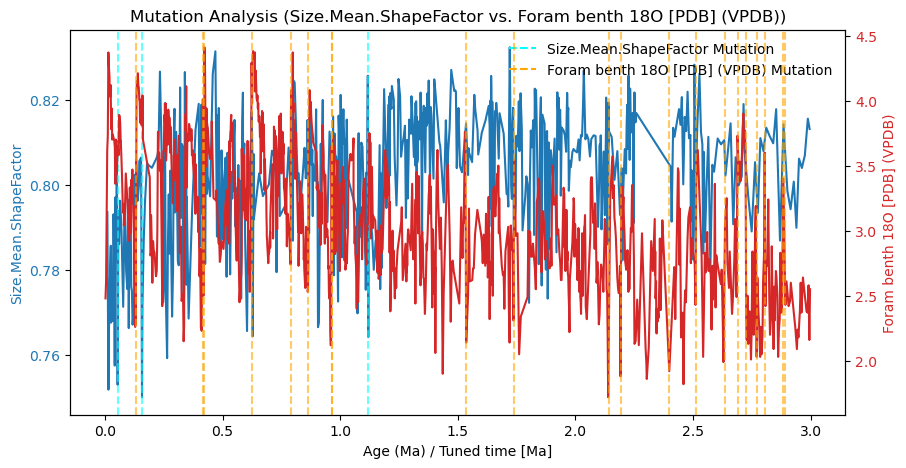

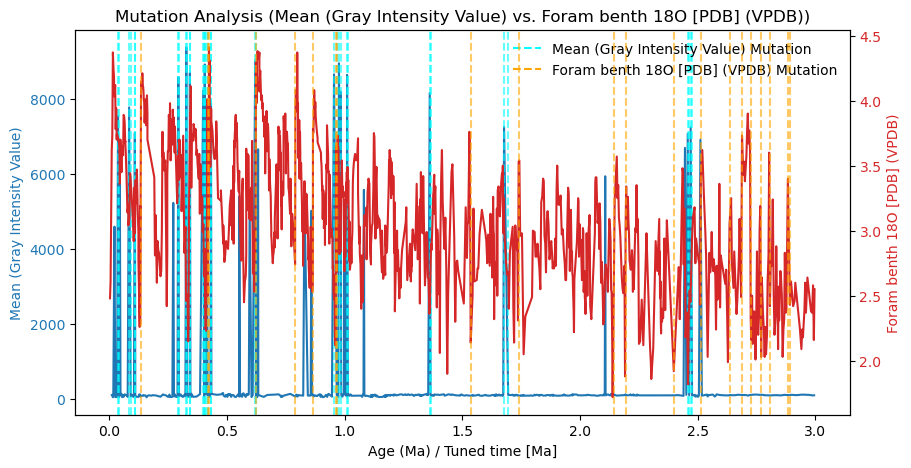

In [13]:
plot_mutation_analysis("Elongation", "Foram benth 13C [PDB] (VPDB)")
plot_mutation_analysis("Perimeter (µm)", "Foram benth 13C [PDB] (VPDB)")
plot_mutation_analysis("Size.Mean.Area", "Foram benth 13C [PDB] (VPDB)")
plot_mutation_analysis("Size.Mean.Sphericity", "Foram benth 13C [PDB] (VPDB)")
plot_mutation_analysis("Size.Mean.ShapeFactor", "Foram benth 13C [PDB] (VPDB)")
plot_mutation_analysis("Mean (Gray Intensity Value)", "Foram benth 13C [PDB] (VPDB)")
plot_mutation_analysis("Elongation", "Foram benth 18O [PDB] (VPDB)")
plot_mutation_analysis("Perimeter (µm)", "Foram benth 18O [PDB] (VPDB)")
plot_mutation_analysis("Size.Mean.Area", "Foram benth 18O [PDB] (VPDB)")
plot_mutation_analysis("Size.Mean.Sphericity", "Foram benth 18O [PDB] (VPDB)")
plot_mutation_analysis("Size.Mean.ShapeFactor", "Foram benth 18O [PDB] (VPDB)")
plot_mutation_analysis("Mean (Gray Intensity Value)", "Foram benth 18O [PDB] (VPDB)")



Close mutation points (time difference ≤ 0.05 Ma):
   Elongation_time  Foram benth 18O [PDB] (VPDB)_time  time_difference
0         0.433583                           0.418849         0.014734
1         0.433583                           0.423008         0.010575
2         1.517867                           1.535710         0.017843
3         2.199510                           2.194049         0.005461


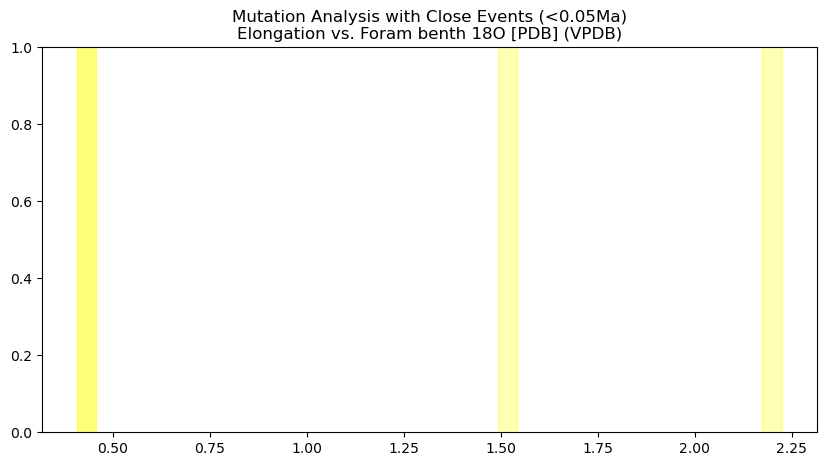

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

def detect_outliers(series, threshold=3):
    """Detect outliers in a time series using differential analysis."""
    diff = series.diff().fillna(0)
    mean, std = diff.mean(), diff.std()
    return (np.abs(diff - mean) > threshold * std)

def find_close_mutations(size_column, C_column, max_time_diff=0.05):
    """
    Find mutation points that occur within a specified time difference.
    
    Args:
        size_column: Column name for size data
        C_column: Column name for isotopic data
        max_time_diff: Maximum time difference (in Ma) to consider as coincident
        
    Returns:
        DataFrame with pairs of close mutation points
    """
    # Load and preprocess data
    df1_filtered, df2_filtered, age_column, time_column = load_and_process_data(size_column, C_column)
    
    # Detect mutation points
    size_outliers = detect_outliers(df1_filtered[size_column], threshold=3)
    C_outliers = detect_outliers(df2_filtered[C_column], threshold=3)
    
    # Get mutation time points
    size_mutations = df1_filtered[age_column][size_outliers].values
    C_mutations = df2_filtered[time_column][C_outliers].values
    
    # Find all pairs within the time threshold
    close_pairs = []
    for s_time in size_mutations:
        for c_time in C_mutations:
            if abs(s_time - c_time) <= max_time_diff:
                close_pairs.append({
                    f'{size_column}_time': s_time,
                    f'{C_column}_time': c_time,
                    'time_difference': abs(s_time - c_time)
                })
    
    return pd.DataFrame(close_pairs)

# Example usage for Elongation and 18O
close_mutations = find_close_mutations("Elongation", "Foram benth 18O [PDB] (VPDB)", max_time_diff=0.05)

# Display the results
print("Close mutation points (time difference ≤ 0.05 Ma):")
print(close_mutations)

# Visualize these points by modifying the plot_mutation_analysis function
def plot_mutation_analysis_with_close_points(size_column, C_column, max_time_diff=0.05):
    """Enhanced version that highlights close mutation points"""
    # First find close mutations
    close_mutations = find_close_mutations(size_column, C_column, max_time_diff)
    
    # Then do the normal plotting
    df1_filtered, df2_filtered, age_column, time_column = load_and_process_data(size_column, C_column)
    size_outliers = detect_outliers(df1_filtered[size_column], threshold=3)
    C_outliers = detect_outliers(df2_filtered[C_column], threshold=3)

    fig, ax1 = plt.subplots(figsize=(10, 5))
    
    # Plotting code remains the same...
    # [Previous plotting code here...]
    
    # Add special markers for close mutation points
    for _, row in close_mutations.iterrows():
        ax1.axvspan(row[f'{size_column}_time'] - 0.025, 
                    row[f'{size_column}_time'] + 0.025, 
                    color='yellow', alpha=0.3)
    
    plt.title(f"Mutation Analysis with Close Events (<{max_time_diff}Ma)\n{size_column} vs. {C_column}")
    plt.show()

# Visualize with highlighted close events
plot_mutation_analysis_with_close_points("Elongation", "Foram benth 18O [PDB] (VPDB)")

In [8]:
def plot_regression_analysis(size_column, C_column):
    """Perform and visualize polynomial regression analysis on two time series.
    
    Args:
        size_column: Name of the size metric column in the first dataset
        C_column: Name of the C metric column in the second dataset
    """
    # Load and preprocess the data
    df1_filtered, df2_filtered, age_column, time_column = load_and_process_data(size_column, C_column)

    # Create figure for regression analysis
    fig, ax1 = plt.subplots(figsize=(10, 5))

    # Plot primary dataset (Size)
    ax1.set_xlabel("Age (Ma) / Tuned time [Ma]")
    ax1.set_ylabel(size_column, color="tab:blue")
    ax1.plot(df1_filtered[age_column], df1_filtered[size_column], 
             label=f"{size_column}", color="tab:blue")
    ax1.tick_params(axis='y', labelcolor="tab:blue")

    # Calculate and plot 2nd-degree polynomial regression for Size
    size_poly = np.polyfit(df1_filtered[age_column], df1_filtered[size_column], deg=2)
    size_fit = np.poly1d(size_poly)
    ax1.plot(df1_filtered[age_column], size_fit(df1_filtered[age_column]), 
             "--", color="navy", label=f"{size_column} Regression")

    # Create secondary axis for C data
    ax2 = ax1.twinx()
    ax2.set_ylabel(C_column, color="tab:red")
    ax2.plot(df2_filtered[time_column], df2_filtered[C_column], 
             label=f"{C_column}", color="tab:red")
    ax2.tick_params(axis='y', labelcolor="tab:red")

    # Calculate and plot 2nd-degree polynomial regression for C
    C_poly = np.polyfit(df2_filtered[time_column], df2_filtered[C_column], deg=2)
    C_fit = np.poly1d(C_poly)
    ax2.plot(df2_filtered[time_column], C_fit(df2_filtered[time_column]), 
             "--", color="darkred", label=f"{C_column} Regression")

    # Add legends
    ax1.legend(loc="upper left")
    ax2.legend(loc="upper right")

    plt.title(f"Regression Analysis ({size_column} vs. {C_column})")
    plt.show()

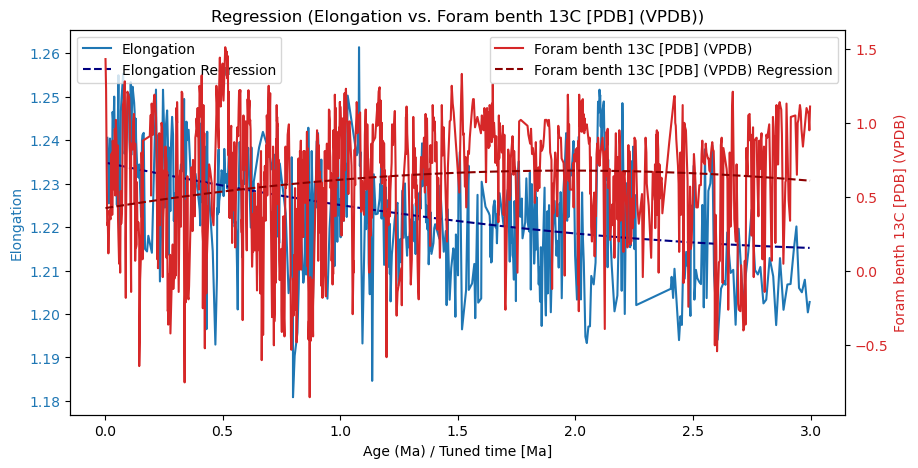

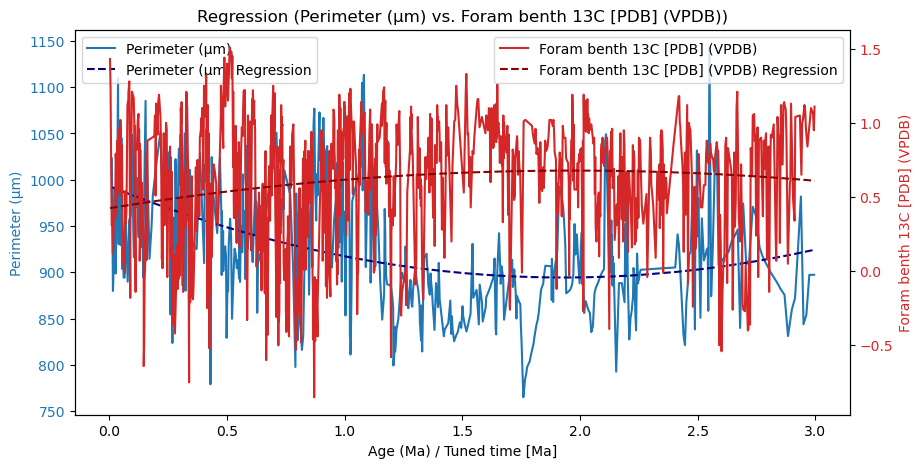

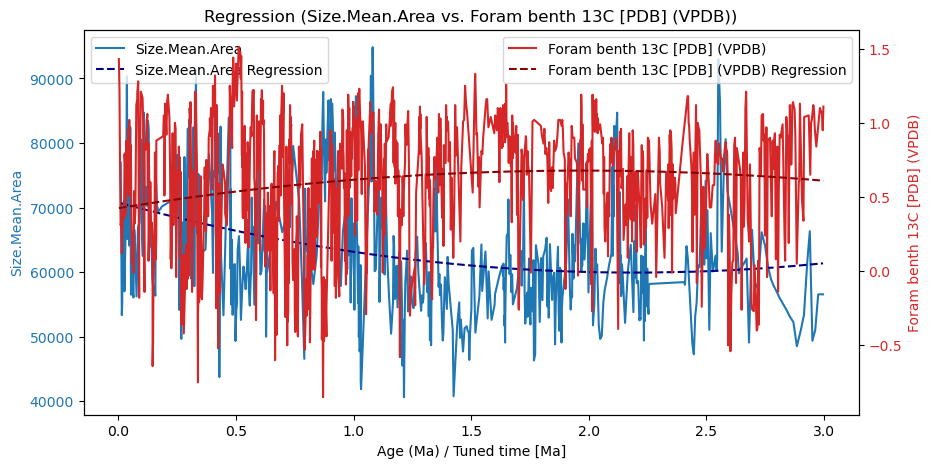

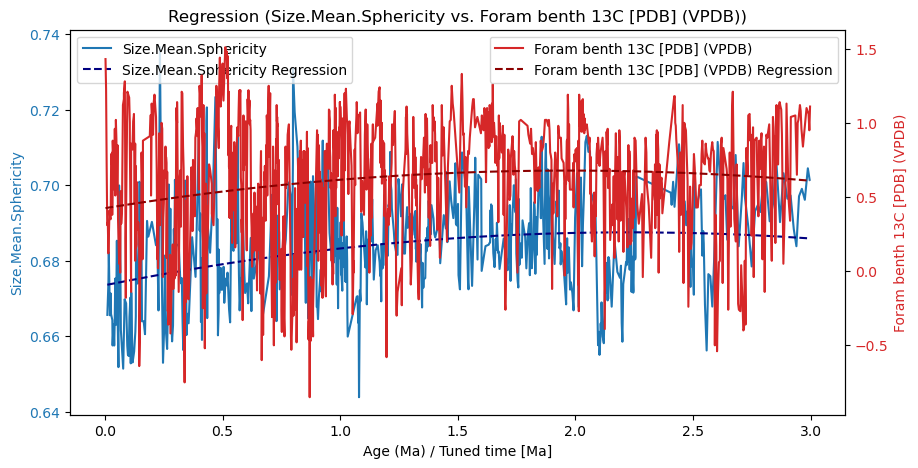

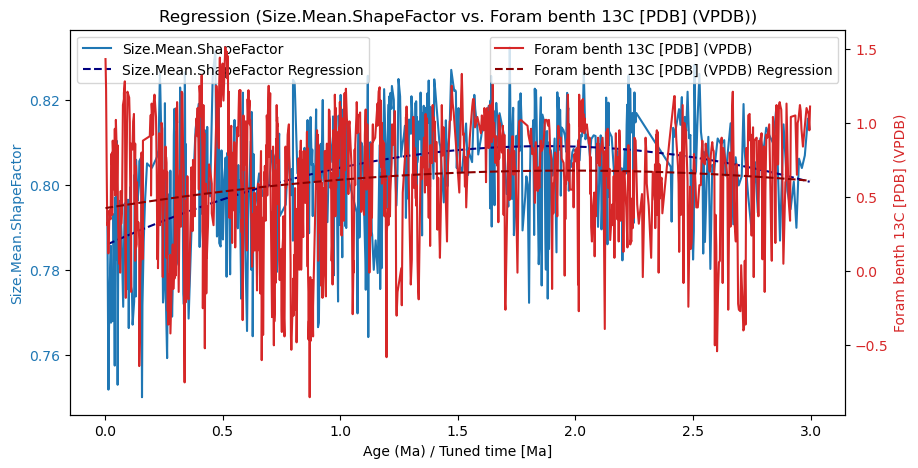

...

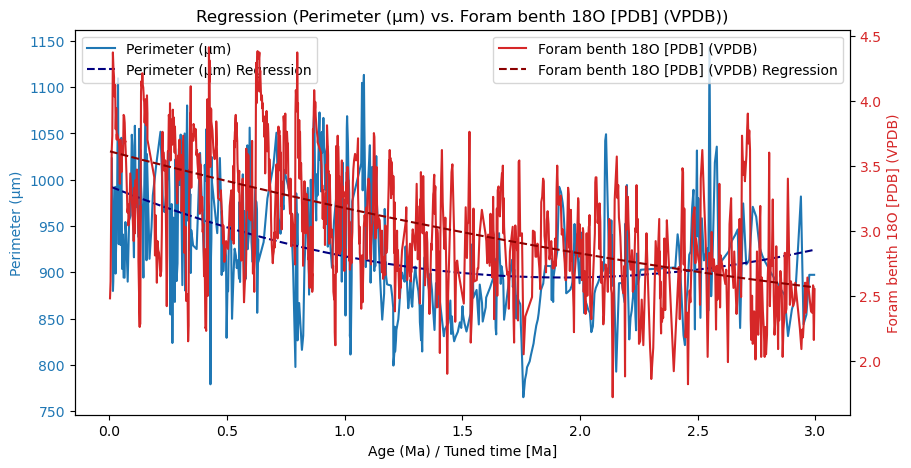

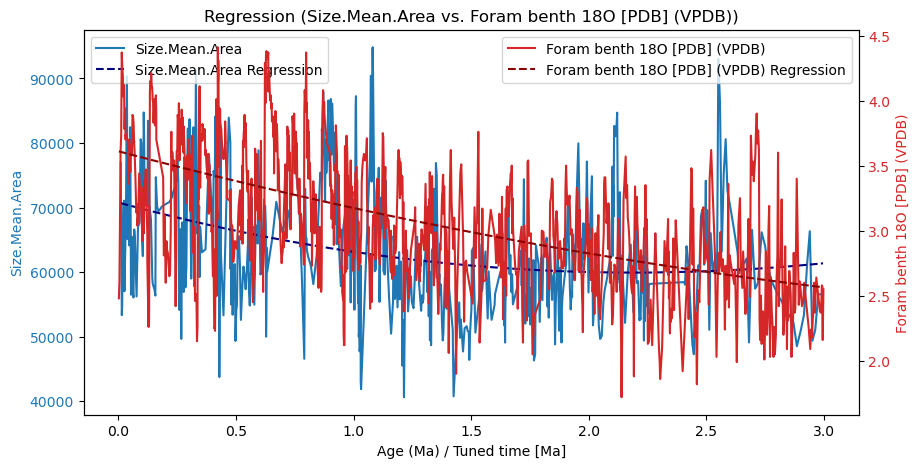

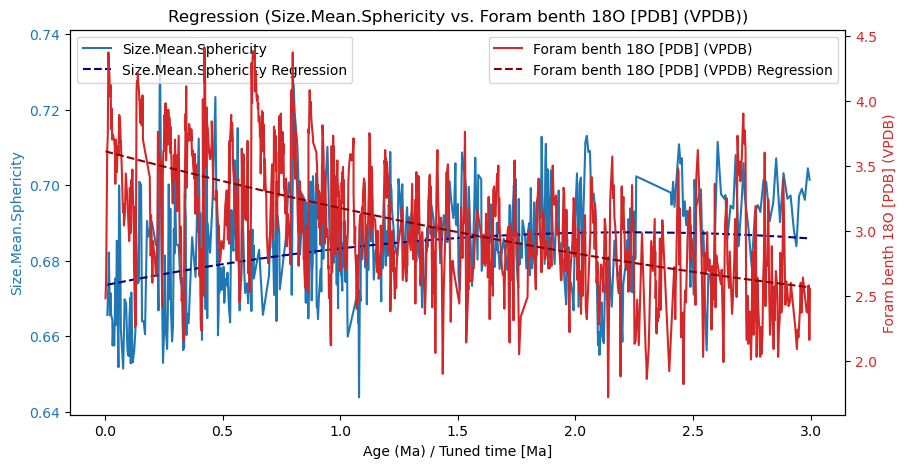

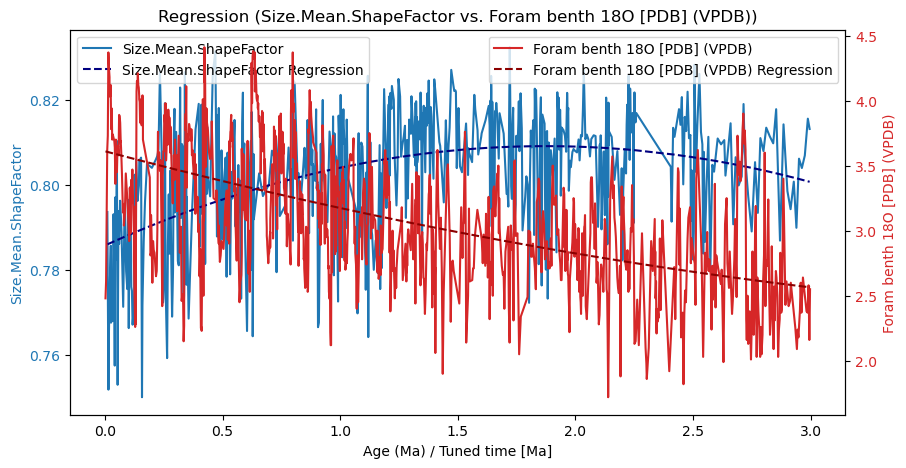

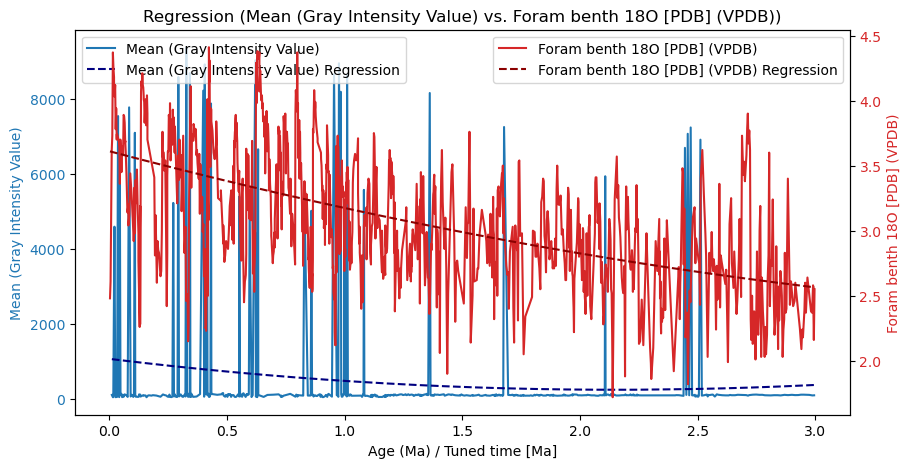

In [9]:
plot_regression_analysis("Elongation", "Foram benth 13C [PDB] (VPDB)")
plot_regression_analysis("Perimeter (µm)", "Foram benth 13C [PDB] (VPDB)")
plot_regression_analysis("Size.Mean.Area", "Foram benth 13C [PDB] (VPDB)")
plot_regression_analysis("Size.Mean.Sphericity", "Foram benth 13C [PDB] (VPDB)")
plot_regression_analysis("Size.Mean.ShapeFactor", "Foram benth 13C [PDB] (VPDB)")
plot_regression_analysis("Mean (Gray Intensity Value)", "Foram benth 13C [PDB] (VPDB)")
plot_regression_analysis("Elongation", "Foram benth 18O [PDB] (VPDB)")
plot_regression_analysis("Perimeter (µm)", "Foram benth 18O [PDB] (VPDB)")
plot_regression_analysis("Size.Mean.Area", "Foram benth 18O [PDB] (VPDB)")
plot_regression_analysis("Size.Mean.Sphericity", "Foram benth 18O [PDB] (VPDB)")
plot_regression_analysis("Size.Mean.ShapeFactor", "Foram benth 18O [PDB] (VPDB)")
plot_regression_analysis("Mean (Gray Intensity Value)", "Foram benth 18O [PDB] (VPDB)")

In [10]:
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler

def plot_box_and_violin_normalized(size_column, C_column):
    """Visualize normalized distributions of two metrics using boxplots and violin plots.
    
    Args:
        size_column: Column name for size metric in first dataset
        C_column: Column name for C metric in second dataset
    """
    # Load data from both tables
    df1_filtered, df2_filtered, _, _ = load_and_process_data(size_column, C_column)

    # Extract relevant columns
    size_data = df1_filtered[size_column]
    C_data = df2_filtered[C_column]

    # Remove NaN values and align lengths (keeping only minimum common length)
    size_valid = size_data.dropna().reset_index(drop=True)
    C_valid = C_data.dropna().reset_index(drop=True)
    min_len = min(len(size_valid), len(C_valid))
    size_valid = size_valid.iloc[:min_len]
    C_valid = C_valid.iloc[:min_len]

    # Create combined DataFrame
    data_valid = pd.DataFrame({
        f'{size_column} (Table 1)': size_valid,
        f'{C_column} (Table 2)': C_valid
    })

    # Normalize data to [0, 1] range
    scaler = MinMaxScaler()
    data_normalized = pd.DataFrame(
        scaler.fit_transform(data_valid),
        columns=data_valid.columns
    )

    # Create figure
    plt.figure(figsize=(12, 6))

    # Boxplot subplot
    plt.subplot(1, 2, 1)
    sns.boxplot(data=data_normalized, palette='Set2')
    plt.title(f"Normalized Boxplot ({size_column} & {C_column})")

    # Violin plot subplot
    plt.subplot(1, 2, 2)
    sns.violinplot(data=data_normalized, palette='Set2')
    plt.title(f"Normalized Violin Plot ({size_column} & {C_column})")

    plt.tight_layout()
    plt.show()


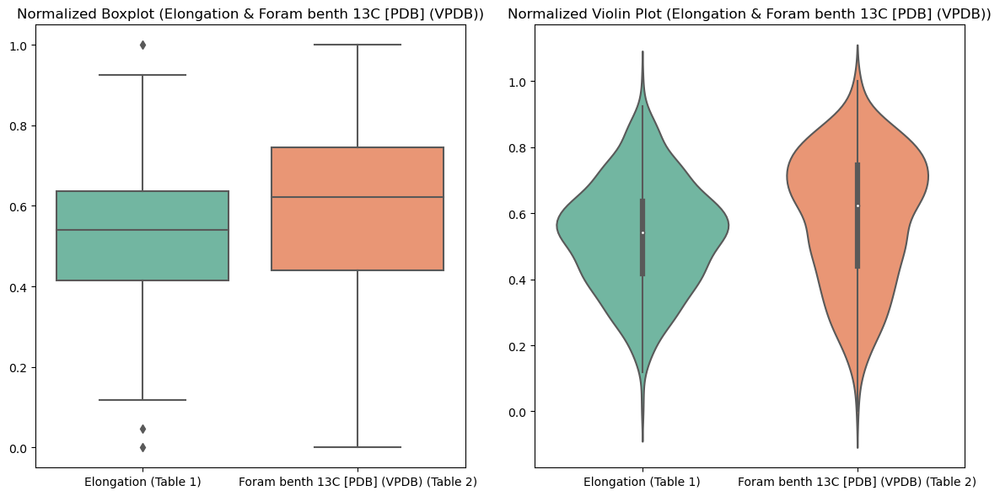

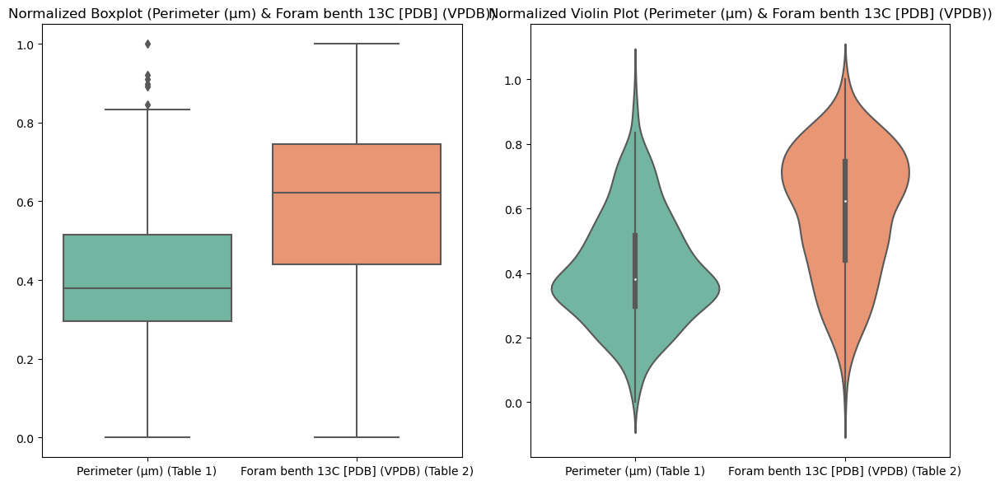

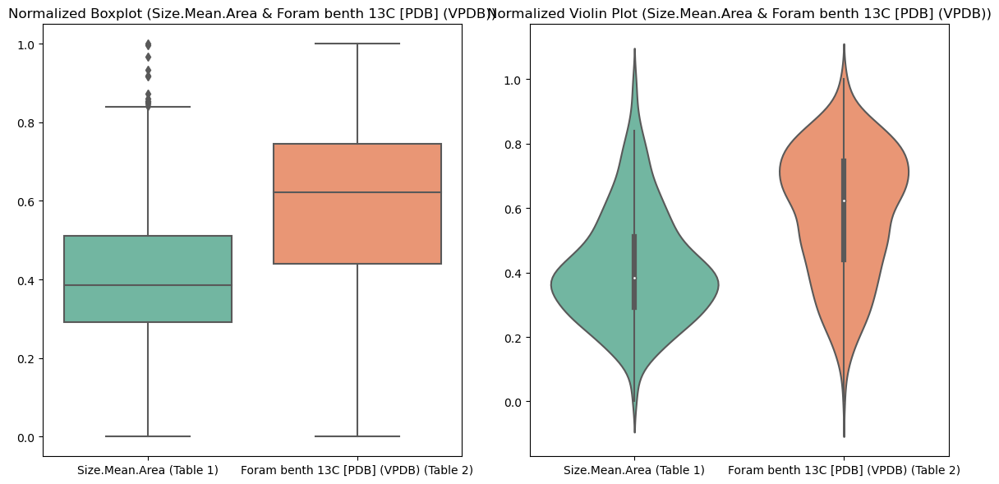

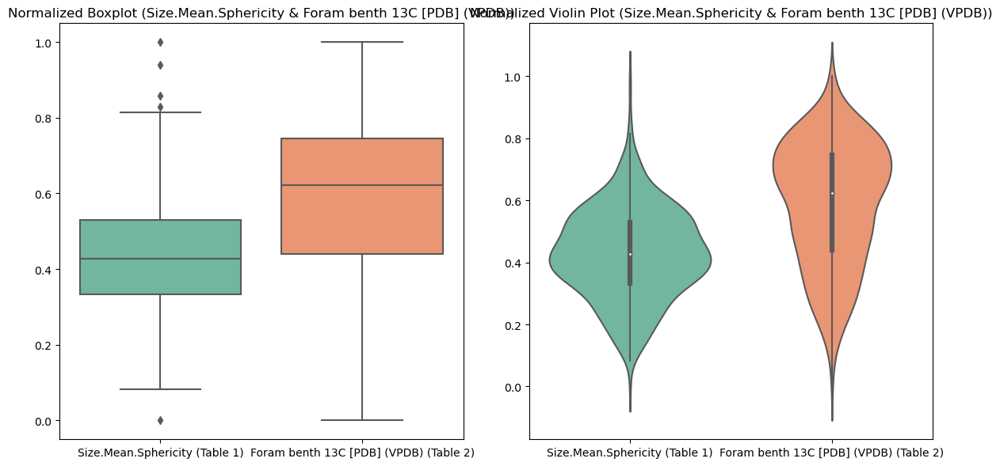

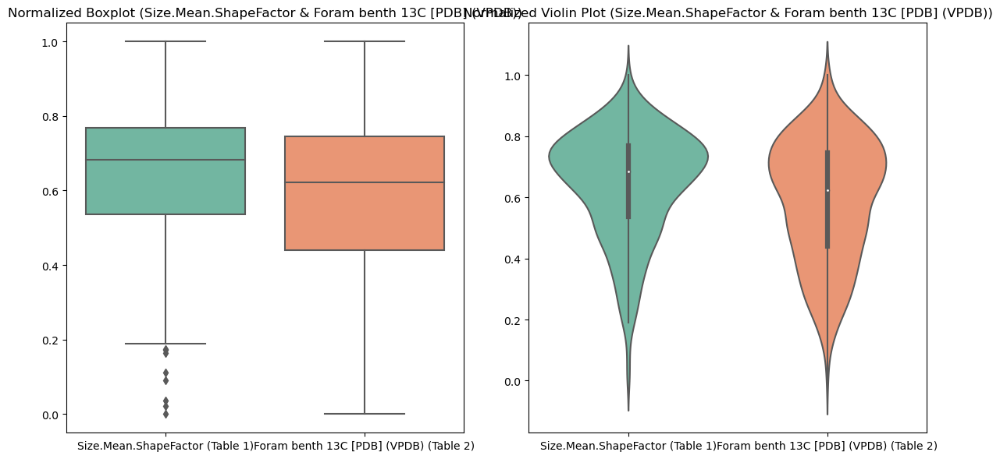

...

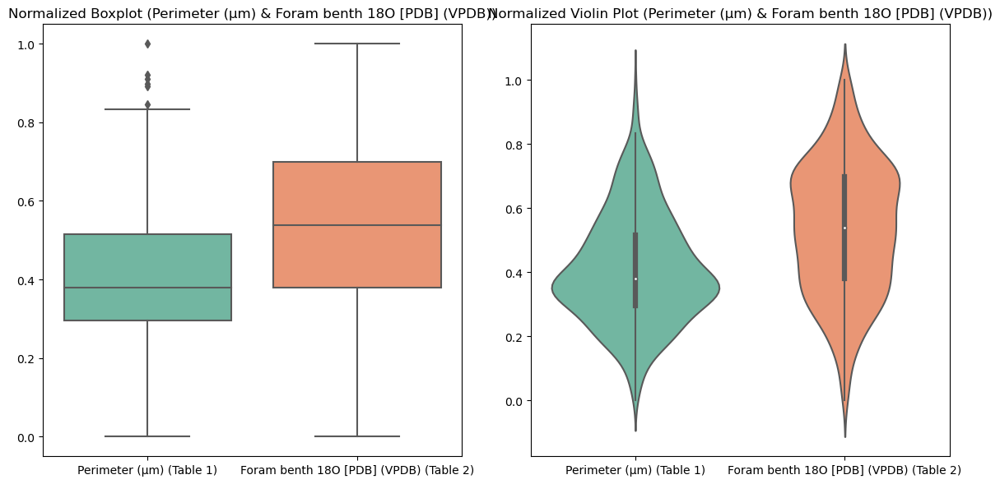

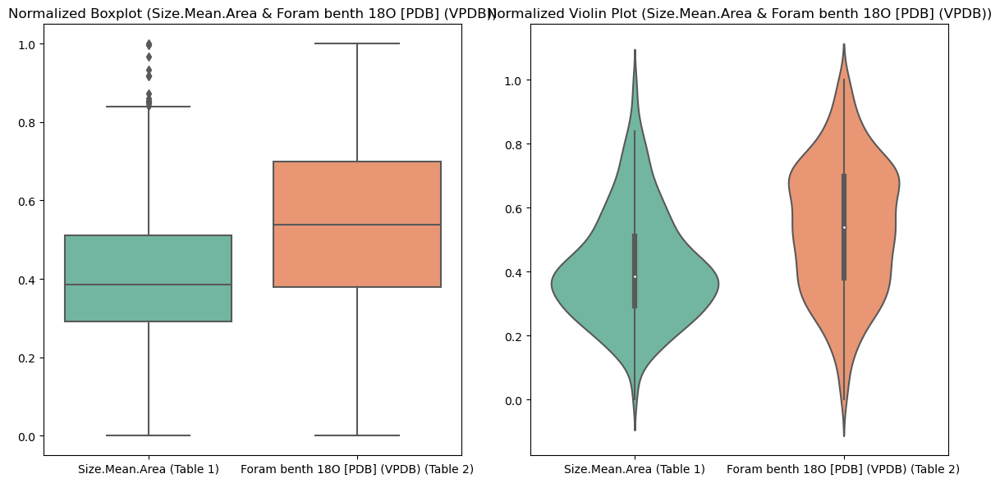

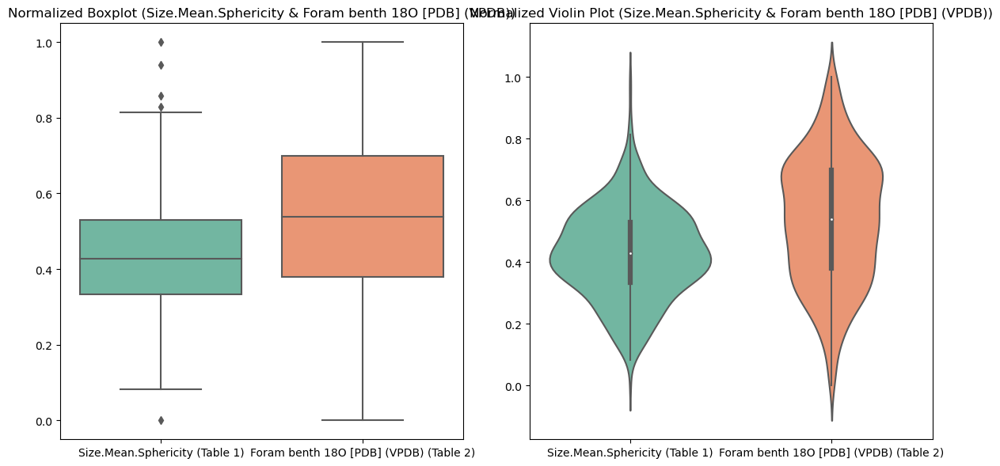

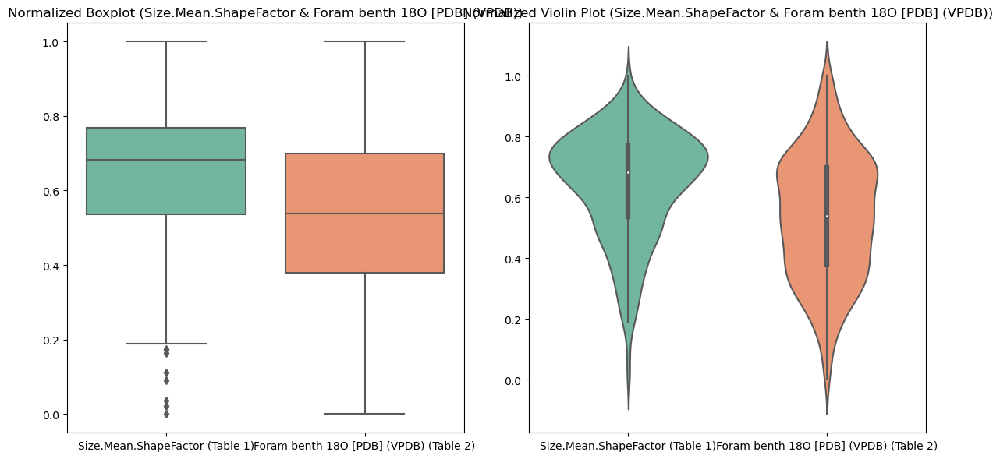

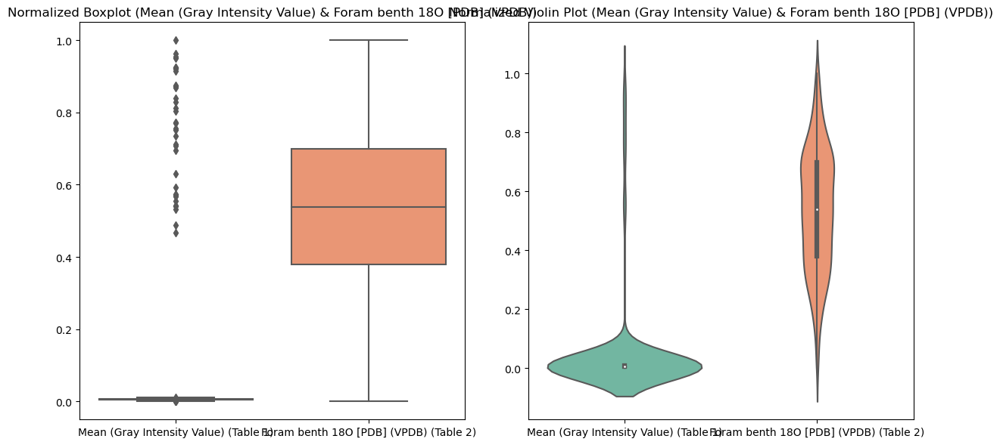

In [11]:
plot_box_and_violin_normalized("Elongation", "Foram benth 13C [PDB] (VPDB)")
plot_box_and_violin_normalized("Perimeter (µm)", "Foram benth 13C [PDB] (VPDB)")
plot_box_and_violin_normalized("Size.Mean.Area", "Foram benth 13C [PDB] (VPDB)")
plot_box_and_violin_normalized("Size.Mean.Sphericity", "Foram benth 13C [PDB] (VPDB)")
plot_box_and_violin_normalized("Size.Mean.ShapeFactor", "Foram benth 13C [PDB] (VPDB)")
plot_box_and_violin_normalized("Mean (Gray Intensity Value)", "Foram benth 13C [PDB] (VPDB)")
plot_box_and_violin_normalized("Elongation", "Foram benth 18O [PDB] (VPDB)")
plot_box_and_violin_normalized("Perimeter (µm)", "Foram benth 18O [PDB] (VPDB)")
plot_box_and_violin_normalized("Size.Mean.Area", "Foram benth 18O [PDB] (VPDB)")
plot_box_and_violin_normalized("Size.Mean.Sphericity", "Foram benth 18O [PDB] (VPDB)")
plot_box_and_violin_normalized("Size.Mean.ShapeFactor", "Foram benth 18O [PDB] (VPDB)")
plot_box_and_violin_normalized("Mean (Gray Intensity Value)", "Foram benth 18O [PDB] (VPDB)")